<h1>Рынок заведений общественного питания Москвы</h1>

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
  
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цель исследования:** Подготовка исследования рынка заведений общественного питания в г. Москва. Поиск полезных особенностей, которые помогут в выборе места для открытия заведения.


**Ход исследования.**

Исследование пройдет в пять этапов:
* Загрузка и обзор данных
* Предобработка данных
* Анализ данных
* Детализация исследования
* Выводы

## Загрузите данные и изучите общую информацию

In [1]:
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly import graph_objects as go

In [2]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Напишем функцию для построения графиков распределения.

In [6]:
def graph(data):
    _, [axs_hist, axs_box] = plt.subplots(2, 1,
                                         figsize=(15, 9), 
                                         sharex=True,
                                         gridspec_kw=dict(height_ratios=[10,1]))
    hist = sns.histplot(data=data, kde=True, ax=axs_hist)
    box = sns.boxplot(data=data, x=data, orient='h', ax=axs_box)
    hist.set(title=f'Гистограмма распределения {data.name}',
             ylabel='Количество записей')
    box.set(xlabel=f'{data.name}');

Построим графики для числовых переменных.

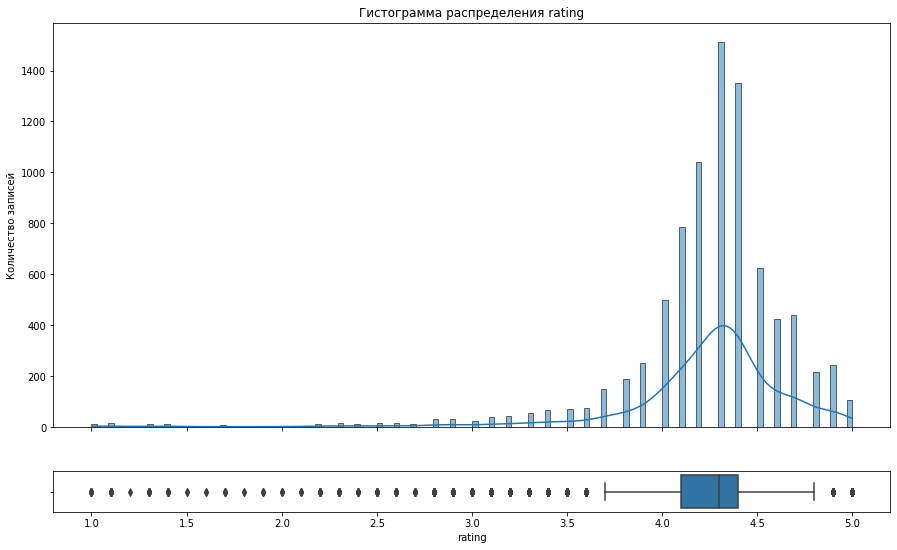

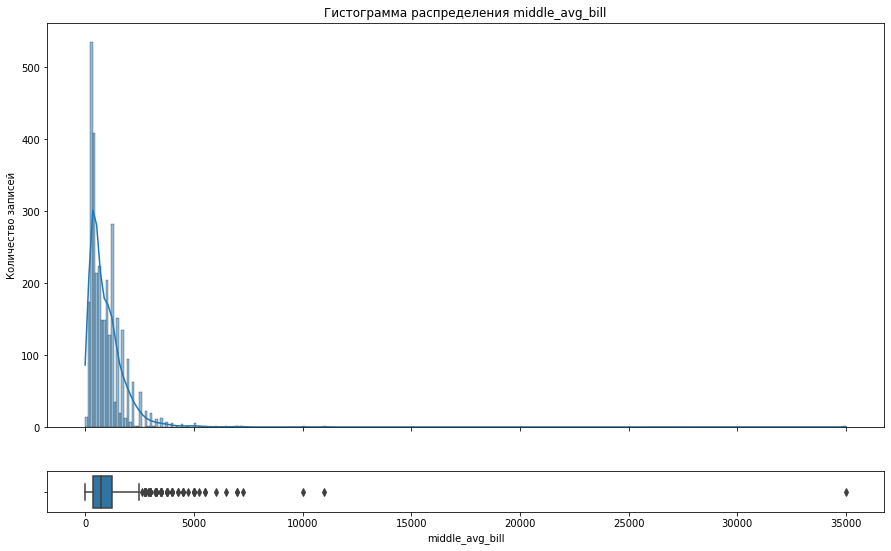

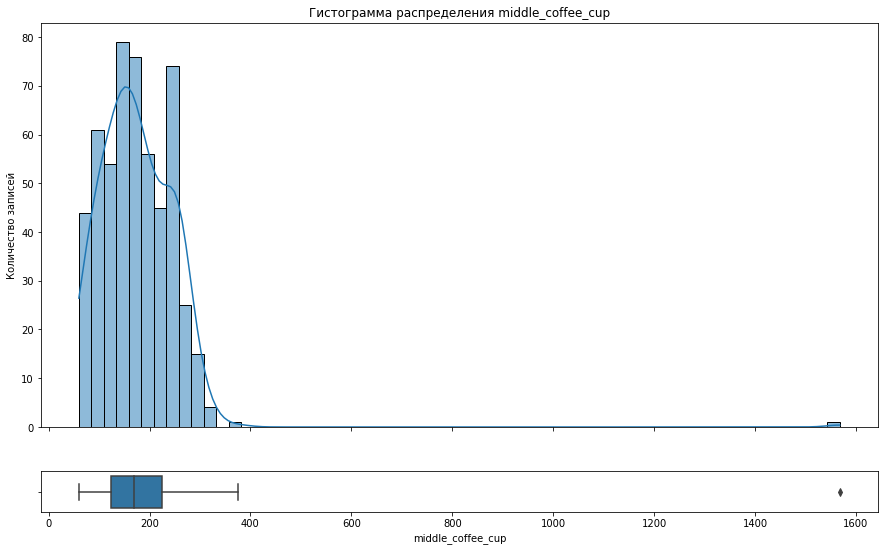

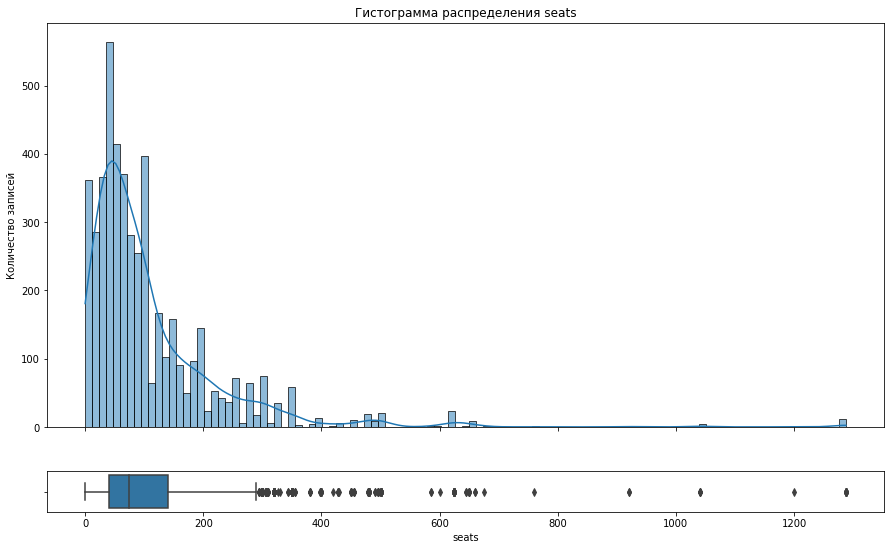

In [7]:
numeric = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']

for i in numeric:
    graph(df[i])

Можно заметить, что в числовых переменных присутствуют выбросы, которые нужно будет учитывать в дальнейшем анализе.

### Вывод

В нашем распоряжении имеется таблица с данными. Каждая запись — это информация о заведениях общественного питания Москвы, составленная на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Согласно документации:  


* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;

* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

        0 — заведение не является сетевым
        1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.


Необходимо будет провести предобработку данных, а именно: проверить данные на наличие пропущенных значений и дубликатов,  добавить столбец `street` с названиями улиц из столбца с адресом и столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно.

## Выполните предобработку данных

Создадим столбец `street` с названиями улиц из столбца с адресом

In [8]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1].strip())
df['street'].unique()

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно

In [9]:
df['is_24/7'] = df['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
df[['hours', 'is_24/7']]

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True


Посмотрим, есть ли в данных пропущенные значения.

In [10]:
df.isna().mean().round(4) * 100

name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.38
lat                   0.00
lng                   0.00
rating                0.00
price                60.56
avg_bill             54.60
middle_avg_bill      62.54
middle_coffee_cup    93.64
chain                 0.00
seats                42.96
street                0.00
is_24/7               0.00
dtype: float64

Мы обнаружили следующие доли пропущенных значений:

* `hours:` - 6.38%
* `price:` - 60.56%
* `avg_bill:` - 54.60%
* `middle_avg_bill:` - 62.54%
* `middle_coffee_cup:` - 93.64%
* `seats:` - 42.96%

Выведем первые пять строк и посмотрим можно ли заполнить пропуски.

In [11]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Проверив информацию на сервисе Яндекс Карты, можно увидеть, что не все заведения указывают информацию из пропущенных столбцов. Также можно заметить, что отсуствующая информация есть например по кафе `WoWфли`, но вероятнее всего на момент выгрузки данных, она еще не была заполнена. Отсутствие этих данных, однако, не мешает дальнейшему исследованию, потому мы можем оставить их, как есть.

Проверим данные на наличие дубликатов.

In [12]:
df.duplicated().sum()

0

Явных дубликатов не обнаружено. Проверим на наличие неявных. Для начала приведем названия заведений к нижнему регистру, для того, чтобы исключить разное написание заведений одной сети.

In [13]:
print(f'До приведения названий к нижнему регистру было {df.name.nunique()} названий') 

До приведения названий к нижнему регистру было 5614 названий


In [14]:
df['name'] = df['name'].str.lower().str.replace('.', ' ', regex=False)
print(f'После приведения названий к нижнему регистру стало {df.name.nunique()} названий') 

После приведения названий к нижнему регистру стало 5511 названий


Таким образом мы нашли 103 заведения с одинаковыми названиями, но разными написаниями первой буквы.

Теперь выведем список с уникальными названиями сетевых заведений и изучим их.

In [15]:
df[df['chain']==1].sort_values(by='name')['name'].unique().tolist()

['1-я креветочная',
 '10 идеальных пицц',
 '18 грамм',
 '4 сезона',
 '7 сэндвичей',
 '8 вафель',
 '9 bar coffee',
 'abc coffee roasters',
 'air coffee',
 'americano black coffee & food',
 'arabix',
 'arcus bar and food',
 'asia gourmet',
 'bakery',
 'bb&burgers',
 'bfl’s',
 'bigсуши',
 'black star burger',
 'bodrero',
 'bon lavash',
 'boston seafood & bar',
 'bowl family',
 'brasserie lambic',
 'bro&n',
 'brooms',
 'burger club',
 'burger heroes',
 'bổ',
 'cafe',
 'cafe inn',
 'café de paris',
 'camera obscura',
 'camorra pizza e birra',
 'campus',
 'cassette cafe',
 'chicha san chen',
 'chicko',
 'cinnabon',
 'city life',
 'cofefest',
 'coffee and the city',
 'coffee bean',
 'coffee break',
 'coffee guru',
 'coffee in',
 'coffee like',
 'coffee moose',
 'coffee music',
 'coffee party',
 'coffee point',
 'coffee way',
 "coffeebar'17",
 'coffeebrain',
 "coffeekaldi's",
 'coffeeshop company',
 'coffeeshots',
 'coffeesphere',
 'coffprice',
 'cofix',
 'conversation',
 'cosmic latte',
 'cro

Мы нашли следующие дубликаты:

* "пекарня буханка" - "буханка"
* "кулинариум - кулинария, пироги, салаты" - "кулинариум"
* "кафе бар" - "кафе-бар"
* "хинкали - gали!" - "хинкали-gали!"
* "чайхона № 1" - "чайхона №1" 

Приведем данные названия к одному виду.

In [16]:
df['name'] = df['name'].replace(to_replace={
                                            'кафе бар': 'кафе-бар',
                                            'кулинариум - кулинария, пироги, салаты': 'кулинариум',
                                            'пекарня буханка': 'буханка',
                                            'хинкали - gали!': 'хинкали-gали!',
                                            'чайхона № 1': 'чайхона №1'
                                            }
                               )

In [17]:
df[df['chain']==1].sort_values(by='name')['name'].unique().tolist()

['1-я креветочная',
 '10 идеальных пицц',
 '18 грамм',
 '4 сезона',
 '7 сэндвичей',
 '8 вафель',
 '9 bar coffee',
 'abc coffee roasters',
 'air coffee',
 'americano black coffee & food',
 'arabix',
 'arcus bar and food',
 'asia gourmet',
 'bakery',
 'bb&burgers',
 'bfl’s',
 'bigсуши',
 'black star burger',
 'bodrero',
 'bon lavash',
 'boston seafood & bar',
 'bowl family',
 'brasserie lambic',
 'bro&n',
 'brooms',
 'burger club',
 'burger heroes',
 'bổ',
 'cafe',
 'cafe inn',
 'café de paris',
 'camera obscura',
 'camorra pizza e birra',
 'campus',
 'cassette cafe',
 'chicha san chen',
 'chicko',
 'cinnabon',
 'city life',
 'cofefest',
 'coffee and the city',
 'coffee bean',
 'coffee break',
 'coffee guru',
 'coffee in',
 'coffee like',
 'coffee moose',
 'coffee music',
 'coffee party',
 'coffee point',
 'coffee way',
 "coffeebar'17",
 'coffeebrain',
 "coffeekaldi's",
 'coffeeshop company',
 'coffeeshots',
 'coffeesphere',
 'coffprice',
 'cofix',
 'conversation',
 'cosmic latte',
 'cro

 Неявные дубликаты исправлены. Можно приступать к анализу данных.

In [64]:
df[['name', 'address']].duplicated().sum()

3

In [65]:
df[df[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,Волоколамское шоссе,False
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,проспект Мира,False
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,проспект Мира,False
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,Ярцевская улица,False
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,Ярцевская улица,False


## Анализ данных

### Распределение заведений по категориям

Посмотрим какие категории заведений представлены в данных. Исследуем количество объектов по категориям и построим визуализации.

In [18]:
df.groupby('category')['category'].agg(['count']).sort_values(by='count', ascending=False)

,count
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


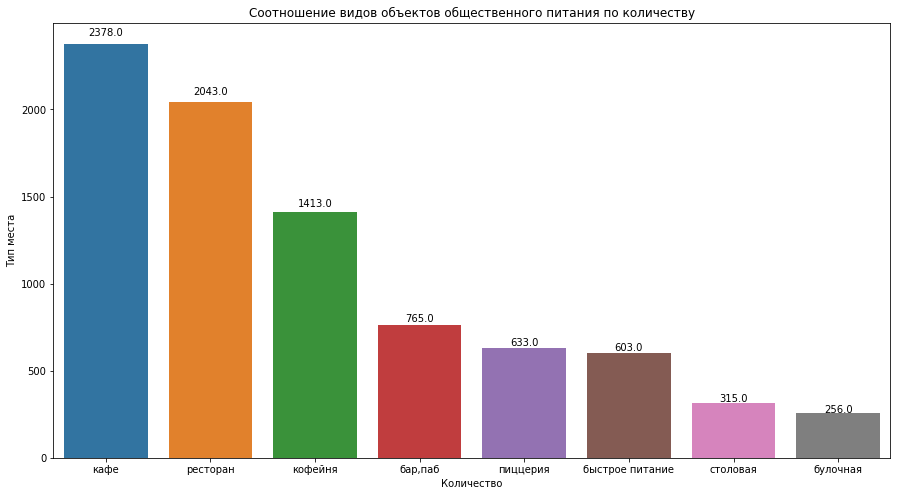

In [19]:
plt.figure(figsize=(15, 8))
ax = sns.barplot(y='count', x='category', data=df.groupby('category')['category'].agg(['count']).sort_values(by='count', ascending=False).reset_index())
plt.xlabel('Количество')
plt.ylabel('Тип места')
plt.title('Соотношение видов объектов общественного питания по количеству')
for i in ax.patches:
        _x = i.get_x() + i.get_width() / 2
        _y = i.get_y() + i.get_height() + (i.get_height()*0.02)
        value = '{:.1f}'.format(i.get_height())
        ax.text(_x, _y, value, ha="center")
plt.show()

Наиболее популярные категории:
* `кафе` – 2378
* `ресторан` – 2043 
* `кофейня` – 1413. 

Остальные категории представлены не так сильно и имеют количество менее 1000, так например, заведений категории `бар,паб` в два раза меньше, чем кофеен.

### Количество посадочных мест по категориям

Исследуем количество посадочных мест в местах по категориям и построим визуализации.

In [20]:
df['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

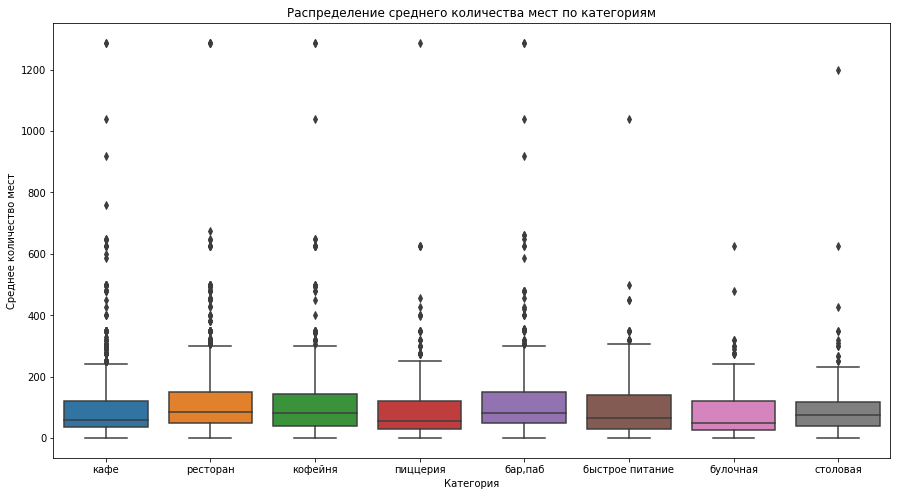

In [21]:
plt.figure(figsize=(15,8))
ax = sns.boxplot(x='category', y='seats', data=df)
ax.set(xlabel='Категория', ylabel='Среднее количество мест', title='Распределение среднего количества мест по категориям')
plt.show()

В данных присутствуют выбросы, так как среднее значительно больше медианы. Медианное значение составляет всего 75 мест на заведение, а максимальное количество мест на одно заведение достигает 1288 (вероятнее всего ошибки при заполнении информации или выгрузке данных). Лучше всего будет использовать медианное значение для дальнейшего анализа.

In [22]:
df.groupby('category')['seats'].agg(['median']).sort_values(by='median', ascending=False)

,median
category,
ресторан,86.0
"бар,паб",82.5
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


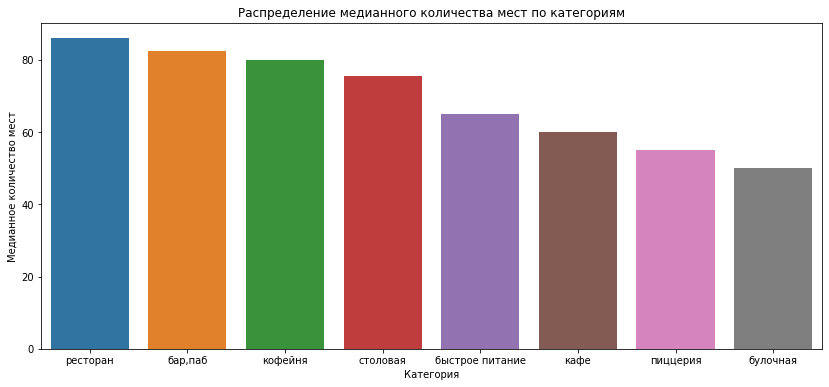

In [23]:
plt.figure(figsize=(14,6))
ax = sns.barplot(x='category', y='median', data=df.groupby('category')['seats'].agg(['median']).sort_values(by='median', ascending=False).reset_index())
ax.set(xlabel='Категория', ylabel='Медианное количество мест', title='Распределение медианного количества мест по категориям')
plt.show()

Таким образом самое большое медианное количество посадочных мест наблюдается в:

* ресторанах (86 мест)
* барах, пабах (82,5 мест)
* кофейнях (80 мест)

Самое маленькое медианное количество посадочных мест наблюдается в:

* кафе (60 мест)
* пиццериях (55 мест)
* булочных (50 мест).

Выбросы наблюдаются по всем категориям.

### Соотношение сетевых и несетевых заведений

Рассмотрим соотношение сетевых и несетевых заведений в датасете и построим график.

In [24]:
print(f'Количество Несетевых заведений: {df["chain"].value_counts()[0]}\
\nКоличество Сетевых заведений: {df["chain"].value_counts()[1]}')
print(f'Доля Cетевых заведений: {df["chain"].mean():.2%}')

Количество Несетевых заведений: 5201
Количество Сетевых заведений: 3205
Доля Cетевых заведений: 38.13%


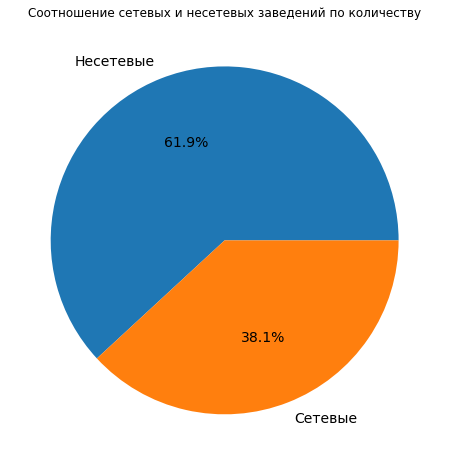

In [25]:
plt.figure(figsize=(8, 8))
plt.title('Соотношение сетевых и несетевых заведений по количеству')
plt.pie(df['chain'].value_counts(), labels = ['Несетевые', 'Сетевые'],  autopct='%1.1f%%',  textprops={'fontsize': 14})
plt.show() 

Количество несетевых заведений в наших данных больше, а именно 61,9%.

### Доли сетевых заведений по категориям

Посмотрим какие категории заведений чаще являются сетевыми.

In [26]:
chain = df.groupby('category')['chain'].agg('mean').round(4).reset_index().sort_values(by='chain', ascending=False)
chain['chain'] = (chain['chain'] * 100).round(2)
chain['non_chain'] = (100 - chain['chain']).round(2)
chain

,category,chain,non_chain
1,булочная,61.33,38.67
5,пиццерия,52.13,47.87
4,кофейня,50.96,49.04
2,быстрое питание,38.47,61.53
6,ресторан,35.73,64.27
3,кафе,32.76,67.24
7,столовая,27.94,72.06
0,"бар,паб",22.09,77.91


In [27]:
fig = go.Figure(data=[
    go.Bar(
           name='сетевые',
           x=chain['category'], 
           y=chain['chain'], 
           text=chain['chain']
          ),
    go.Bar(
           name='несетевые',
           x=chain['category'], 
           y=chain['non_chain'], 
           text=chain['non_chain']
          )
])
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        'text':'Доли сетевых заведений по категориям в процентах',
        'y':0.9,
        'x':0.48},
    xaxis_title="Категория заведений",
    yaxis_title="Процент сетевых заведений",
    barmode='stack',
    width=800, height=600)
fig.update_traces(textposition='inside', showlegend=True)
fig.show()


Чаще всего сетевыми являются:
* булочные - 61.33%
* пиццерии - 52.13%
* кофейни - 50.96%

Кафе, столовые и бары/пабы чаще других категорий являются несетевыми заведениями.

### Топ 15 самых популярных сетей в Москве

Найдем топ-15 популярных сетей в Москве (по количеству). Сгруппируем заведения по названию и категории, предварительно отобрав только сетевые, а затем оставим только 15 самых популярных.

In [28]:
top_15 = df[df['chain'] == 1].groupby(['name', 'category'])['street'].agg('count').nlargest(15).reset_index().rename(columns={'street': 'count'})
top_15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,яндекс лавка,ресторан,72
4,one price coffee,кофейня,71
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


Теперь посмотрим какие категории самые популярные и построим график.

In [29]:
top_15_cat = top_15.groupby('category')['count'].agg('sum').reset_index().sort_values(by='count', ascending=False)
top_15_cat['percentage'] = (top_15_cat['count'] / top_15_cat['count'].sum()).round(4)*100
top_15_cat

,category,count,percentage
2,кофейня,350,45.16
4,ресторан,157,20.26
3,пиццерия,150,19.35
1,кафе,89,11.48
0,булочная,29,3.74


In [30]:
fig = px.sunburst(top_15, path=['category', 'name'], values='count',\
                  color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(
                    margin = dict(t=50, l=10, r=10, b=10),
                    title = {
                             'text': 'Топ-15 популярных сетей в Москве',
                             'y':0.95,
                             'x':0.48
                            }
                )

fig.show()

Мы составили список из топ-15 самых популярных сетей по числу заведений:

* Самой популярной сетью оказалась `Шоколадница` - 119 заведений
* Самой непопулярной сетью оказалось `Кофемания` - 27 заведений

Большая часть заведений относится к кофейням: среди топ-15 популярных сетей 45% (350) заведений принадлежат к категории кофейня. Наименее популярная категория 3% (25) – булочная.


В целом относительное распределение заведений по категориям имеет следующий вид:  
* `кофейня` – 45% (350)
* `ресторан` – 20% (157)
* `пиццерия` – 19,5% (150)
* `кафе` – 11,5% (89)
* `булочная` – 3.2% (25)

### Распределение заведений по районам Москвы

Посмотрим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [31]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [32]:
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [33]:
dist_cat = df.groupby(['district', 'category'])['name'].agg('count').reset_index().rename(columns={'name': 'count'})
dist_cat

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


Для читаемости графика, создадим словарь с аббревиатурами районов и добавим столбец с ними к нашим сгруппированным данным.

In [34]:
district_abbr = {
    'Северный административный округ': 'САО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Западный административный округ': 'ЮЗАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Центральный административный округ': 'ЦАО',
    'Северо-Восточный административный округ': 'СВАО',
    'Зеленоградский административный округ': 'ЗАО'
}

dist_cat['district_abbr'] = dist_cat['district'].replace(district_abbr)

Построим график количества заведений каждой категории по районам

In [35]:
fig = px.bar(dist_cat, 
             x='count', 
             y='district_abbr',                   
             color='category'
            )

fig.update_layout(
                    title = {
                                'text': 'Количество заведений каждой категории по районам',
                                'y':0.95,
                                'x':0.48
                            },
                    xaxis_title='Количество заведений',
                    yaxis_title='Название района',
                    yaxis={'categoryorder':'total ascending'},
                    legend_title='Категория'
                )
fig.show() 

На фоне всех остальных административных округов заметно выделяется Центральный административный округ: в нем не только в два раза больше заведений в сравнении с остальными округами, но и соотношение категорий сильно отличается. 

В Центральном административном округе значительно больше баров и ресторанов. Но при этом популярность кафе ниже, чем в остальных округах. Больше всего доля кафе в Юго-восточном административном округе.

### Распределение средних рейтингов по категориям заведений

Визуализируем распределение средних рейтингов по категориям заведений и посмотрим сильно ли различаются усреднённые рейтинги в разных типах общепита.

In [36]:
avg_rating = df.groupby('category')['rating'].agg('mean').round(2).reset_index().sort_values('rating', ascending=False)
avg_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [37]:
fig = px.bar(avg_rating, x='category', y='rating', text='rating', range_y=(4, 4.5))
fig.update_layout(
                    title = {
                                'text': 'Средний рейтинг по категориям заведений',
                                 'y':0.95,
                                 'x':0.48
                            },
                    xaxis_title="Категория",
                    yaxis_title="Рейтинг")
fig.show()

Средние рейтинги по категориям варьируются от 4.05 для ресторанов быстрого питания до 4.39 для баров/пабов. 
В целом можно сказать, что для остальных категорий оценки не так сильно отличаются.

### Фоновая картограмма со средним рейтингом заведений по районам

Построим фоновую картограмму со средним рейтингом заведений каждого района.

In [38]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [39]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг в центральном административном округе. Можно предположить, что средний чек там тоже самый высокий.

### Размещение заведений на карте

Теперь отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [40]:
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

In [41]:
top_15_street = df.groupby('street')['name'].agg('count').nlargest(15).reset_index().rename(columns={'name': 'count'})
top_15_street

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [42]:
list = top_15_street.street.to_list()
filtered = df.copy()
filtered = df[df['street'].isin(list)]

In [43]:
fig = px.bar(filtered.groupby(['street', 'category'])['name'].agg('count').reset_index().rename(columns={'name': 'count'}), 
             x='count', 
             y='street',                   
             color='category'
            )

fig.update_layout(
                    title = {
                                'text': 'Количество заведений каждой категории по районам',
                                'y':0.95,
                                'x':0.48
                            },
                    xaxis_title='Количество заведений',
                    yaxis_title='Улица',
                    yaxis={'categoryorder':'total ascending'},
                    legend_title='Категория'
                )
fig.show() 

Можно предположить, что есть положительная корреляция между протяжкнностью улицы и количеством заведений, расположенных на этой ней, например:

* лидирует проспект Мира (8,9 км) – 184 заведения
* на последнем месте Пятницкая улица (1,8 км) – 48 заведений

На самом Проспекте Мира, самыми популярным категориями являются:
* Кафе - 53 шт.
* Рестораны - 45 шт.
* Кофейни - 36 шт.  

Эти же три категории остаются самыми популярными и на большинстве других улиц.
Также можно заметить, что на МКАДе основной категорией является `кафе`, в то время как пиццерий не представлено.

### Улицы с одним объектом общепита

Найдем улицы, на которых находится только один объект общепита.

In [44]:
one_est_street = df.groupby('street')['name'].agg('count').reset_index()
one_est_street = one_est_street.query('name==1')['street'].to_list()
one_est_street = df[df['street'].isin(one_est_street)]
print(f'Количество улиц с одним объектом общепита: {len(one_est_street)}')

Количество улиц с одним объектом общепита: 458


Посмотрим как они расположены по районам.

In [45]:
one_est_street['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

И по категориям.

In [46]:
one_est_street['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

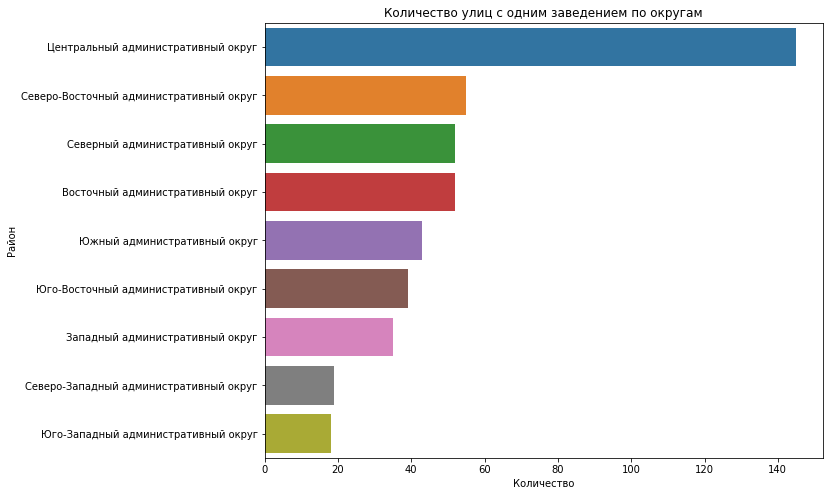

In [47]:
plt.figure(figsize=(10,8))
ax = sns.countplot(y='district', data=one_est_street, order = one_est_street['district'].value_counts().index)
plt.xlabel('Количество')
plt.ylabel('Район')
plt.title('Количество улиц с одним заведением по округам')
plt.show()

В Центральном административном округе больше всего улиц с одним заведением – 145.

Самой популярной категорией заведений для таких улиц являются `кафе` - 160 заведений.

### Фоновая картограмма районов по медианному чеку

Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

Проанализируем медианные цены по разным округам. Визуализируем результат

In [48]:
df.groupby('district')['middle_avg_bill'].agg('median').reset_index().sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [49]:
m_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=df.groupby('district')['middle_avg_bill'].agg('median').reset_index(),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений общепита по районам Москвы',
).add_to(m_bill)

# выводим карту
m_bill

* Центральный и Западный административные округа обладают самыми высоким медианным чеком - 1000 рублей. 
* Северный и Северо-западные административные округа имеют медианный чек в промежутке 633-725.
* Восточный и Юго-западный административные округа – 542-633. 
* Северо-восточный, Юго-восточный и южный административные округа – 450-542.

На высокие медианные цены в Западном округе может оказывать влияние то, что внутри него расположен аэропорт Внуково. Многие кафе и рестораны у аэропортов могут завышать цены благодаря довольно путешественникам во время пересадок.

### Вывод

В ходе исследования мы провели обзор и предобработку данных: создали новые столбцы с названием улиц и информацией о часах работы заведения в бинарном формате – 0 если заведение не работает в формате 24/7 и 1, если заведение работает ежедневно и круглосуточно. Проверили на наличие пропущенных значений и дубликатов.

В результате анализа данных можно сделать следующие выводы:

1. Наиболее популярные категории заведений:  
    
  * `кафе` – 2378 заведений
  * `ресторан` – 2043 заведений
  * `кофейня` – 1413 заведений
    

2. По количеству посадочных мест по медианным значениям топ возглавляют следующие категории заведений:
    
  * `ресторан` – 86 посадочных мест
  * `бар/паб` – 82.5 посадочных места
  * `кофейня` – 80 посадочных мест 


3. Изучив соотношение сетевых и несетевых заведений получили следующие результаты:

  * несетевых заведений больше, и они составляют 61.9% от общего числа. (5201 заведений.)
  * сетевые заведения в меньшинстве, всего 38.1% от общего числа. (3205 заведений.)


4. Исследовав распределение сетевых заведений по категориям в процентах, установили, что чаще всего сетевыми являются:

  * `булочные` - 61.33% от их общего числа
  * `пиццерии` - 52.13% от их общего числа
  * `кофейни` - 50.96% от их общего числа
    
    
5. Мы определили топ-15 самых популярных сетей в Москве и получили следующее:

  * Самой популярной сетью оказалась Шоколадница - 119 заведений
  * Самой непопулярной сетью оказалось Кофемания - 27 заведений


6. Выделив наиболее популярные сети по количеству заведений мы можем наблюдать следующее распределение по категориям:

  * `кофейня` – 45% (350)
  * `ресторан` – 20% (157)
  * `пиццерия` – 19,5% (150)
  * `кафе` – 11,5% (89)
  * `булочная` – 3.2% (25)
    
    
7. Изучив распределение заведений по районам и категориям заметили следующее:
    
  * На фоне всех остальных административных округов заметно выделяется Центральный административный округ: в нем не только в два раза больше заведений в сравнении с остальными округами, но и соотношение категорий сильно отличается.
  * В Центральном административном округе значительно больше баров и ресторанов. Но при этом популярность кафе ниже, чем в остальных округах. Больше всего доля кафе в Юго-восточном административном округе.

    
8. Изучили распределение средних рейтингов по категориям заведений: 

  * самым высоким рейтингом обладают `бары, пабы` - 4.39
  * самым низким рейтингом обладают заведения `быстрого питания` - 4.05
  * разница между рейтингами оказалась слишком мала, чтобы считаться значимой
    
    
9. Составили фоновую картограмму с распределением усредненного рейтинга заведений по районам Москвы:

  * самые высокие рейтинги приходятся на Центральный административный округ. После него идут Северный административный округ и Северно-западный административный округ.
  * подавляющая часть всех заведений расположена в Центральном округе - 2242 заведения. Чем дальше от центра, тем меньше их плотность.
    
    
10. Мы определили топ-15 улиц по количеству заведений и получили следующие результаты:
    
  * самой популярной улицей является Проспект Мира - 184 заведения
  * на самом Проспекте Мира, самыми популярным категориями являются:
  
  
        `Кафе` - 53 заведения
        `Рестораны` - 45 заведений
        `Кофейни` - 36 заведений
        
  * эти же три категории остаются самыми популярными и на большинстве других улиц
  * обратили отдельное внимание на МКАД, где предпочтение отдается практически эксклюзивно категории `Кафе`.
    
    
11. Изучив улицы с одним объектом общепита, получили следующие результаты:

  * всего таких улиц - 458 
  * подавляющее большинство таких улиц приходится на Центральный административный округ - 145
  * самой популярной категорией заведений для таких улиц являются `Кафе` - 160 заведений.


12. Составили фоновую картограмму районов по медианному чеку и пришли к следующим выводам:
  * Центральный и Западный административные округа обладают самыми высоким медианным чеком - 1000 рублей
  * чем ближе к центру расположены заведения, тем выше медианный чек.

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответим на следующие вопросы:

1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?    
2. Есть ли круглосуточные кофейни?
3. Какие у кофеен рейтинги? Как они распределяются по районам?
4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Вопрос 1

Посмотрим сколько всего кофеен в датасете и в каких районах их больше всего.

In [50]:
coffee = df.query('category == "кофейня"')
print(f'Всего кофеен в датасете: {coffee["name"].shape[0]}')

Всего кофеен в датасете: 1413


In [51]:
coffee_dist = coffee.pivot_table(index='district', values='name', aggfunc='count').reset_index()\
.sort_values(by='name', ascending=False)
coffee_dist.columns = ['district', 'count']
coffee_dist['percentage'] = round((coffee_dist['count'] / coffee_dist['count'].sum())*100,1)
coffee_dist['district_abbr'] = coffee_dist['district'].replace(district_abbr)
coffee_dist

,district,count,percentage,district_abbr
5,Центральный административный округ,428,30.3,ЦАО
2,Северный административный округ,193,13.7,САО
3,Северо-Восточный административный округ,159,11.3,СВАО
1,Западный административный округ,150,10.6,ЗАО
8,Южный административный округ,131,9.3,ЮАО
0,Восточный административный округ,105,7.4,ВАО
7,Юго-Западный административный округ,96,6.8,ЮЗАО
6,Юго-Восточный административный округ,89,6.3,ЮВАО
4,Северо-Западный административный округ,62,4.4,СЗАО


In [52]:
fig = px.bar(coffee_dist, 
             x='count', 
             y='district_abbr', 
             text=['{} или {:.1%}'.format(v, p/100) for v,p in zip(coffee_dist['count'], coffee_dist['percentage'])]
            )

fig.update_layout(
                    title = {
                                'text': 'Количество заведений каждой категории по районам',
                                'y':0.95,
                                'x':0.48
                            },
                    xaxis_title='Количество заведений',
                    yaxis_title='Название района',
                    yaxis={'categoryorder':'total ascending'},
                    legend_title='Категория'
                )
fig.show() 

В датасете присутствует 1413 кофеен.

Можно отметить, что самая высокая концентрация кофеен приходится на Центральный округ - целых 428 заведений, что составляет 30.3% от всех кофеен Москвы.

Для сравнения, второй по счету район - Северный административный округ, в котором всего 193 заведения, или 13.7%, что в два раза меньше чем в Центральном. Далее число кофеен по округам снижается более равномерно.

Центральный административный округ является очень популярным местом для размещения любого объекта общепита, особенно если конкурентоспособность не является для предпринимателя проблемой. Высокая концентрация туристических мест и присутствие крупных бизнес-центров обеспечивает постоянный поток посетителей в кофейни.

### Вопрос 2

Посмотрим есть ли круглосуточные кофейни.

In [53]:
print(f'Количество круглосуточных кофеен: {coffee[coffee["is_24/7"] == True]["is_24/7"].count()}')
print(f'Доля круглосуточных кофеен: {coffee["is_24/7"].mean():.2%}')

Количество круглосуточных кофеен: 59
Доля круглосуточных кофеен: 4.18%


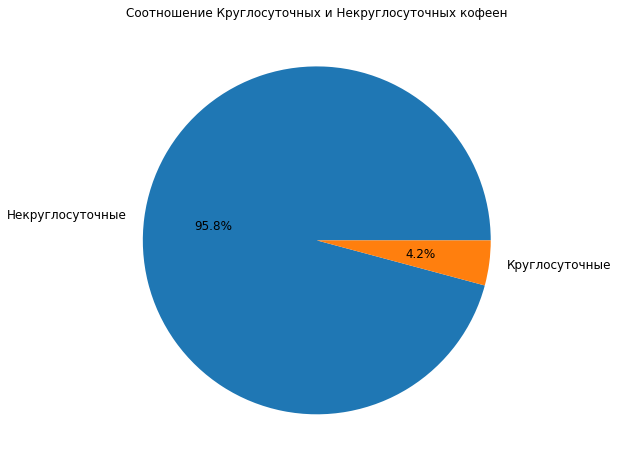

In [54]:
plt.figure(figsize=(8, 8))
plt.title('Соотношение Круглосуточных и Некруглосуточных кофеен')
plt.pie(coffee['is_24/7'].value_counts(), labels = ['Некруглосуточные', 'Круглосуточные'],  autopct='%1.1f%%',  textprops={'fontsize': 12})
plt.show() 

Круглосуточных кофеен всего 4.18%. Скорее всего они не пользуются особой популярностью.

### Вопрос 3

Посмотрим какие у кофеен рейтинги и как они распределяются по районам.

In [55]:
coffee_rtg = coffee.groupby('district')['rating'].agg('mean').reset_index().round(2).sort_values(by='rating', ascending=False)
coffee_rtg

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [56]:
m_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=coffee_rtg,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_coffee)

# выводим карту
m_coffee

Самый высокий средний рейтинг наблюдается у Центрального округа - 4.34, сразу следом идет Северо-Западный округ - 4.33

Чем дальше от центра, тем ниже рейтинг. Самый низкий рейтинг в Западном административном округе - 4.2	

Разброс между рейтингами кофеен по районам настолько мал (от 4.2 до 4.34), что его можно не учитывать при выборе места для открытия.

### Вопрос 4

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Для начала посмотрим на расперделение стоимости чашки капучино.

In [57]:
df[df['category'] == 'кофейня']['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

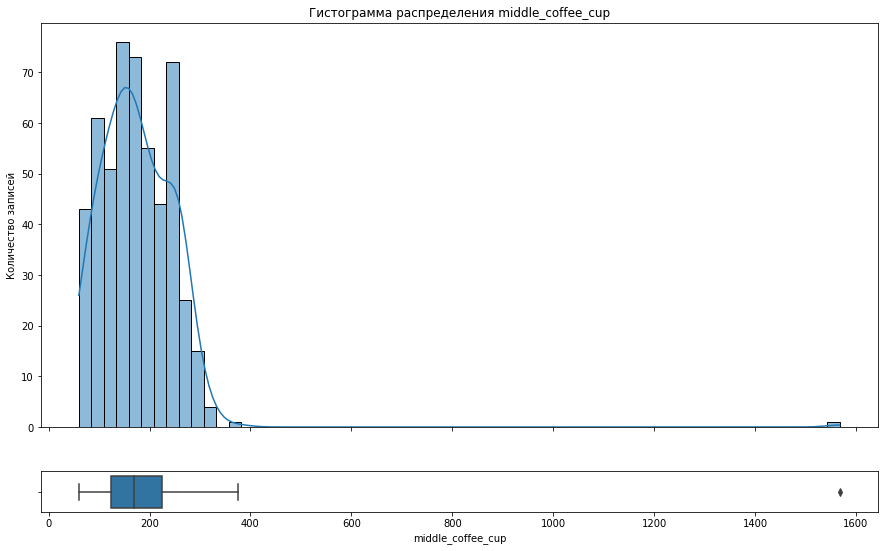

In [58]:
graph(df[df['category'] == 'кофейня']['middle_coffee_cup'])

Мы видим присутствие крупных выбросов. В таблице есть заведение, которое в среднем продает капучино за 1568 рублей. Поэтому, ориентироваться на среднюю стоимость всего столбца мы не можем. 

Отфильтруем данные, оставив только кофейни в которых стоимость чашки капучино менее 400 рублей и посмотрим распределение еще раз.

In [59]:
clean_coffee_df = coffee.copy()
clean_coffee_df = clean_coffee_df[clean_coffee_df['middle_coffee_cup'] < 400]

In [60]:
fig = px.box(clean_coffee_df, y='middle_coffee_cup', width=600, height=600)
fig.update_layout(
                    title = {
                                'text': 'Распределение средней стоимости чашки капучино',
                                'y':0.95,
                                'x':0.61
                            },
                    yaxis_title='Средняя стоимость',
                    margin=dict(l=160, r=0, b=50, t=50)
                )
fig.show()

Из графика можно увидеть, что стоимость большинства чашек находится в диапазоне от 124 до 225 рублей.

Медианной стоимостью чашки капучино является 170 рублей. Поэтому, при открытии кофейни среднего уровня, необходимо ориентироваться именно на этот показатель.

Также посмотрим на распределение медианной цены чашки капучино по районам.

In [61]:
avg_cup_price = clean_coffee_df.groupby('district')['middle_coffee_cup'].agg(['median']).reset_index().sort_values(by='median', ascending=False)
avg_cup_price

,district,median
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [62]:
clean_coffee_df['district_abbr'] = clean_coffee_df['district'].replace(district_abbr)

In [63]:
fig = px.box(clean_coffee_df, x='district_abbr', y='middle_coffee_cup')
fig.update_layout(
                    title = {
                                'text': 'Распределение средней стоимости чашки капучино по районам',
                                'y':0.95,
                                'x':0.48
                            },
                    yaxis_title='Средняя стоимость',
                    xaxis_title='Район'
                )
fig.show()

Можно увидеть, что районами с самым дорогим кофе (медианная цена) являются:
* Юго-Западный административный округ - 198 рублей
* Центральный административный округ - 190 рублей
* Западный административный округ - 189 рублей

## Вывод

Мы провели исследование заведений общественного питания в городе Москва и ответили на поставленные вопросы:

1) Всего в Москве 1413 кофеен. Мы расположили их на карте Москвы, и получили следующие результаты:  

    - Больше всего кофеен (428 или 30.3%) расположено в Центральном административном округе
    - Второй по счету район - Северный административный округ, в котором 193 заведения (13.7%)
2) Круглосуточные кофейни есть, но их очень мало - всего 4.22%. Скорее всего они не пользуются особой популярностью.

3) Мы изучили рейтинги кофеен, и установили следующее:
    
    - Самый высокий средний рейтинг наблюдается у Центрального округа - 4.34, сразу следом идет Северо-Западный округ - 4.33
    - Чем дальше от центра, тем меньше рейтинг
    - Разброс между рейтингами кофеен по районам настолько мал (от 4.2 до 4.34), что его можно не учитывать при выборе места для открытия.
    
4) Медианной стоимостью чашки капучино является 170 рублей, а стоимость большинства чашек находится в диапазоне от 124 до 225 рублей.

**На основе результатов можно дать следующие рекомендации для открытия кофейни:**

* Так как самый высокий спрос на кофейни приходится на Центральный административный округ и заказчики не боятся конкуренции, то для расположения кофейни стоит выбрать именно этот район. 
* Круглосуточность не является обязательным фактором при открытии кофейни, так как мало клиентов будут пить кофе поздней ночью.
* Средний рейтинг кофеен по районам отличается незначительно, так что ориентироваться на него при выборе места не нужно.
* Исследовав медианную стоимость чашки капучино, мы установили, что она находится на уровне 170 рублей. При этом, если рассматривать Центральный административный округ, то там медианная цена чуть выше - 190 рублей, а разброс цен от 139 до 250. Таким образом, если заказчик хочет открыть доступную кофейню и успешно конкурировать в этой нише, то стоило бы рассмотреть цены чуть ниже медианной.